# Extracting Text from Images in Python

<img src="https://media.arxiv-vanity.com/render-output/6158804/images/fig_2_no_trademarks.png" alt="text to images" width="600" height="600">


In [4]:
import pandas as pd
import numpy as np

from glob import glob
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
from PIL import Image

plt.style.use('ggplot')

# Outline
1. Take a look at the data
2. Extract text from images:
    - pytesseract
    - easyocr
    - keras_ocr
3. Run on a few examples and compare the results

In [6]:
annot = pd.read_parquet('text_ocr/annot.parquet')
imgs = pd.read_parquet('text_ocr/img.parquet')
img_fns = glob('text_ocr/train_val_images/train_images/*')

# Plot Example Images

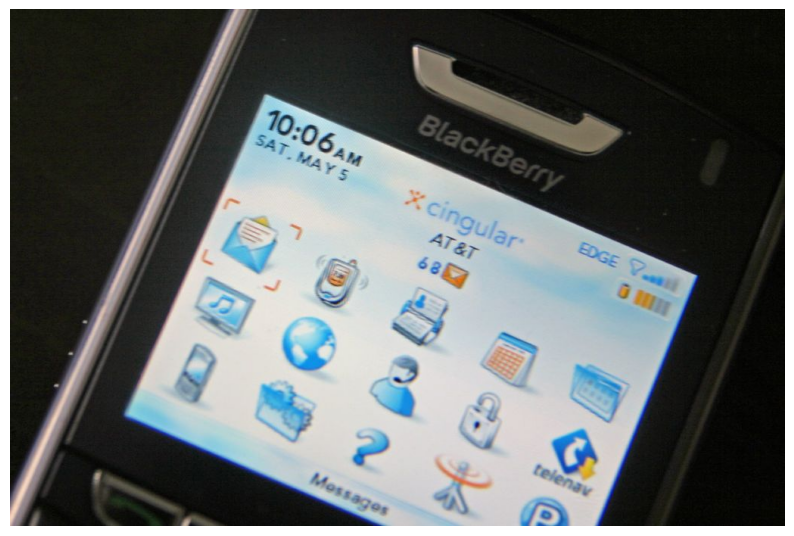

In [7]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(plt.imread(img_fns[0]))
ax.axis('off')
plt.show()

In [8]:
image_id = img_fns[0].split('/')[-1].split('.')[0]
annot.query('image_id == @image_id')

,id,image_id,bbox,utf8_string,points,area


## Display for first 25 images

100%|██████████| 25/25 [00:06<00:00,  3.65it/s]


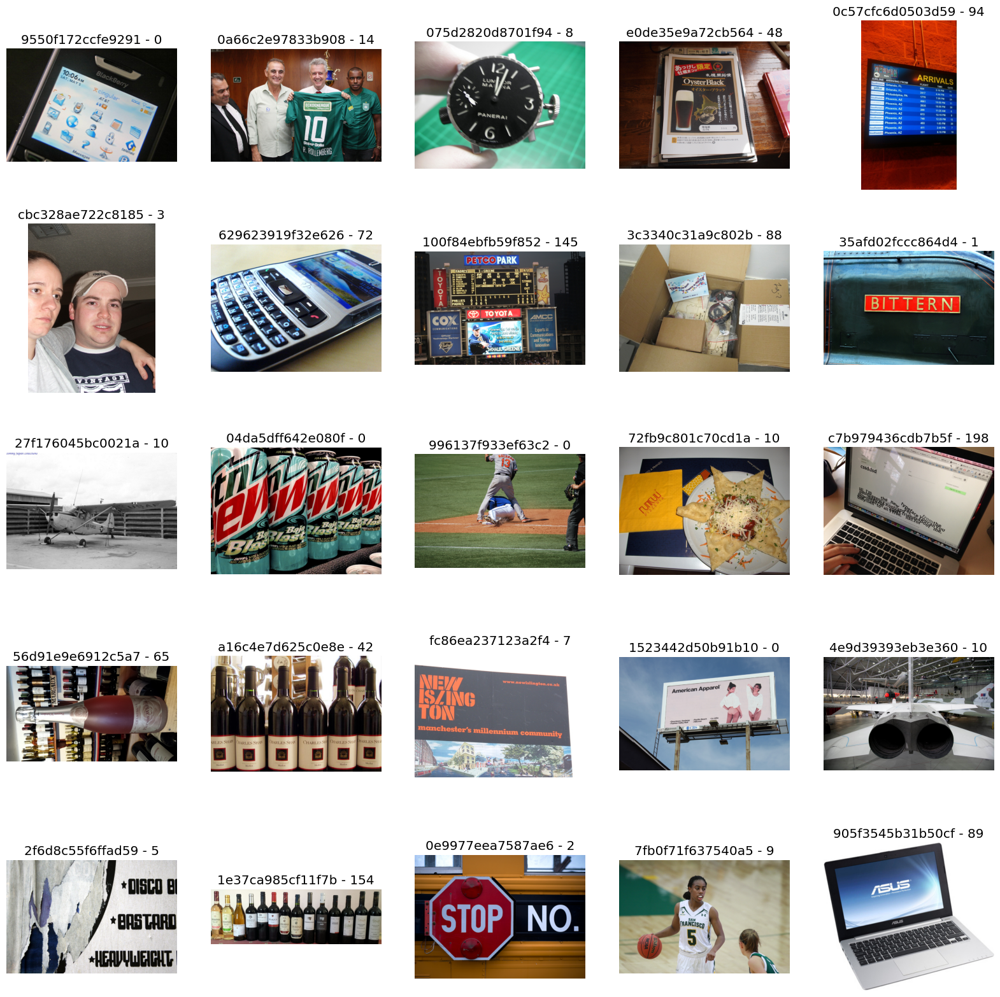

In [9]:

from tqdm import tqdm, trange

fig, axs = plt.subplots(5, 5, figsize=(20, 20))
axs = axs.flatten()
for i in trange(25):
    axs[-i].imshow(plt.imread(img_fns[i]))
    axs[-i].axis('off')
    image_id = img_fns[i].split('/')[-1].rstrip('.jpg')
    n_annot = len(annot.query('image_id == @image_id'))
    axs[-i].set_title(f'{image_id} - {n_annot}')
plt.show()

# Method 1: pytesseract

In [11]:
import pytesseract

# Example call
print(pytesseract.image_to_string(img_fns[11], lang='eng'))

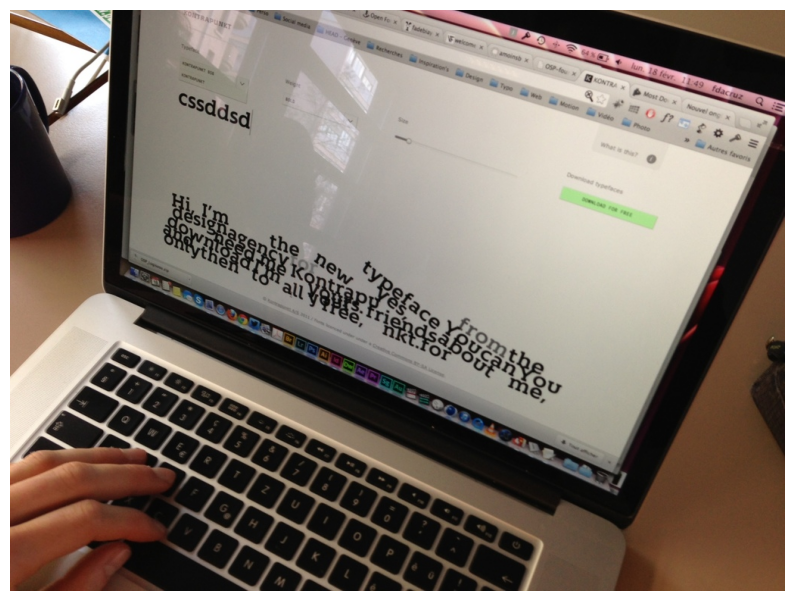

In [12]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(plt.imread(img_fns[11]))
ax.axis('off')
plt.show()

# Method 2: easyocr

In [14]:
import easyocr

reader = easyocr.Reader(['en'], gpu = True)

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [15]:
results = reader.readtext(img_fns[11])

In [16]:
pd.DataFrame(results, columns=['bbox','text','conf'])

,bbox,text,conf
0,"[[296, 292], [328, 292], [328, 324], [296, 324]]",8e,0.540305
1,"[[246, 296], [294, 296], [294, 348], [246, 348]]","""38",0.245162
2,"[[654, 480], [734, 480], [734, 528], [654, 528]]",n8u,0.289308
3,"[[771.4929798734366, 86.13806578484223], [799....",DAaTa,0.004885
4,"[[887.4700010599968, 87.15200169599491], [917....",1149,0.219725
5,"[[928.6526856441764, 97.06225123927629], [972....",Id44uz,0.067851
6,"[[837.5143570688214, 105.12584272387846], [868...",No4 Dr,0.029212
7,"[[222.39177126298424, 96.04651320939753], [330...",cssddsd,0.975338
8,"[[215.22726851413617, 232.04996755884855], [31...",Hesdias,0.209824
9,"[[343.272393124891, 288.089572499564], [391.98...",the,0.999943


# Method 3: keras_ocr

In [17]:
!pip install keras-ocr -q

In [19]:
import keras_ocr

pipeline = keras_ocr.pipeline.Pipeline()

2024-01-18 17:23:31.558684: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-18 17:23:31.558896: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-18 17:23:31.564393: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-18 17:23:31.613379: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-18 17:23:38.828312: W tensorflow/compiler/tf2

Looking for /home/arthurpfonseca/.keras-ocr/craft_mlt_25k.h5
Instructions for updating:
Use `tf.image.resize(...method=ResizeMethod.BILINEAR...)` instead.
Looking for /home/arthurpfonseca/.keras-ocr/crnn_kurapan.h5


In [20]:
results = pipeline.recognize([img_fns[11]])

2024-01-18 17:24:25.703974: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 805306368 exceeds 10% of free system memory.
2024-01-18 17:24:26.722167: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 805306368 exceeds 10% of free system memory.
2024-01-18 17:24:27.888604: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 805306368 exceeds 10% of free system memory.
2024-01-18 17:24:33.355591: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 805306368 exceeds 10% of free system memory.
2024-01-18 17:24:34.317088: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 201326592 exceeds 10% of free system memory.


In [ ]:
pd.DataFrame(results[0], columns=['text', 'bbox'])

,text,bbox
0,dog,"[[6.0, 599.0], [31.0, 599.0], [31.0, 610.0], [..."
1,dirt,"[[67.53808, 597.46704], [104.066, 600.0762], [..."
2,devil,"[[101.0, 600.0], [149.0, 600.0], [149.0, 622.0..."
3,continental,"[[200.06012, 606.7333], [302.16663, 608.1714],..."
4,food,"[[2.0, 611.0], [34.0, 611.0], [34.0, 623.0], [..."
5,gte,"[[595.0, 718.0], [619.0, 718.0], [619.0, 726.0..."
6,litersts,"[[152.32657, 772.63214], [228.6387, 776.5456],..."
7,400,"[[230.0, 800.0], [261.0, 800.0], [261.0, 819.0..."
8,earl,"[[507.10864, 809.71954], [536.4231, 811.1154],..."
9,averill,"[[500.0, 821.0], [545.0, 821.0], [545.0, 831.0..."


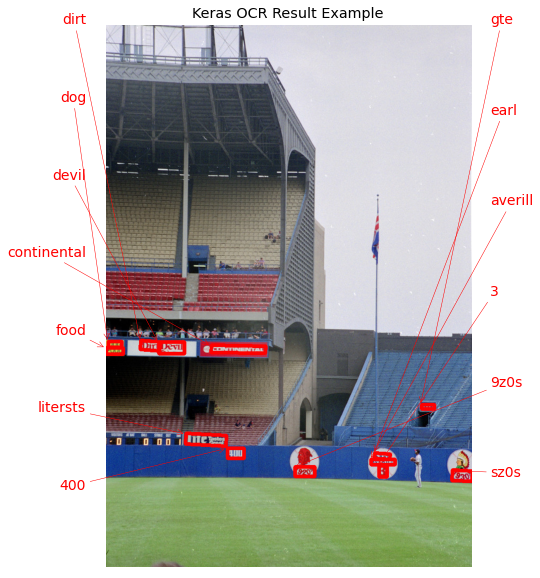

In [15]:
fig, ax = plt.subplots(figsize=(10, 10))
keras_ocr.tools.drawAnnotations(plt.imread(img_fns[11]), results[0], ax=ax)
ax.set_title('Keras OCR Result Example')
plt.show()

# Compare easyocr vs. keras_ocr

In [16]:
# easyocr
reader = easyocr.Reader(['en'], gpu = True)

dfs = []
for img in tqdm(img_fns[:25]):
    result = reader.readtext(img)
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['bbox','text','conf'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
easyocr_df = pd.concat(dfs)

  0%|          | 0/25 [00:00<?, ?it/s]

In [17]:
# keras_ocr
pipeline = keras_ocr.pipeline.Pipeline()

dfs = []
for img in tqdm(img_fns[:25]):
    results = pipeline.recognize([img])
    result = results[0]
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['text', 'bbox'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
kerasocr_df = pd.concat(dfs)

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


  0%|          | 0/25 [00:00<?, ?it/s]

# Plot Results: easyocr vs keras_ocr

In [18]:
def plot_compare(img_fn, easyocr_df, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    easy_results = easyocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    easy_results = [(x[0], np.array(x[1])) for x in easy_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    easy_results, ax=axs[0])
    axs[0].set_title('easyocr results', fontsize=24)

    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    keras_results, ax=axs[1])
    axs[1].set_title('keras_ocr results', fontsize=24)
    plt.show()

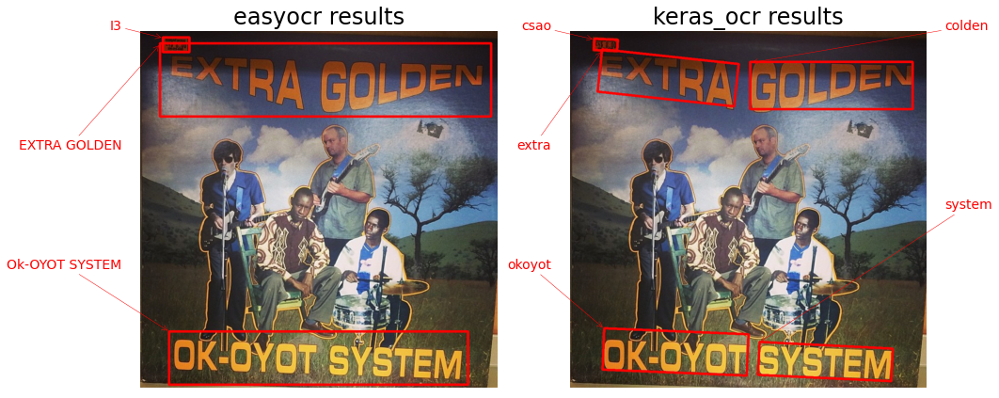

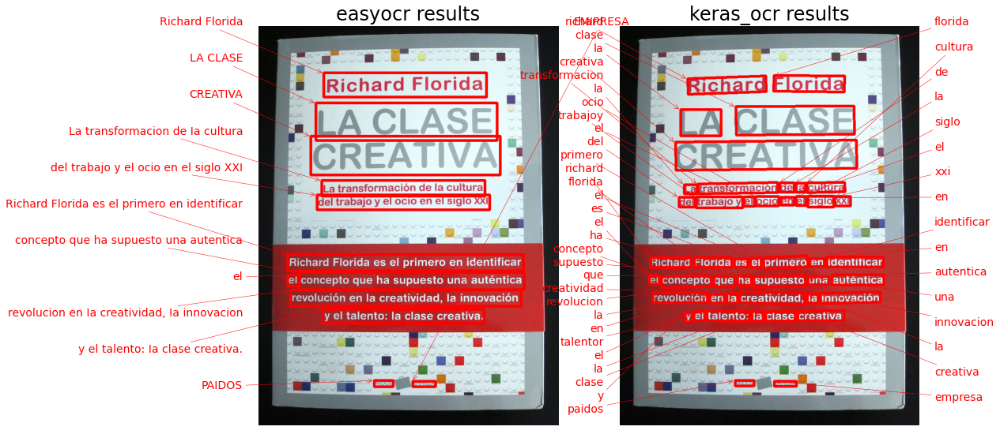

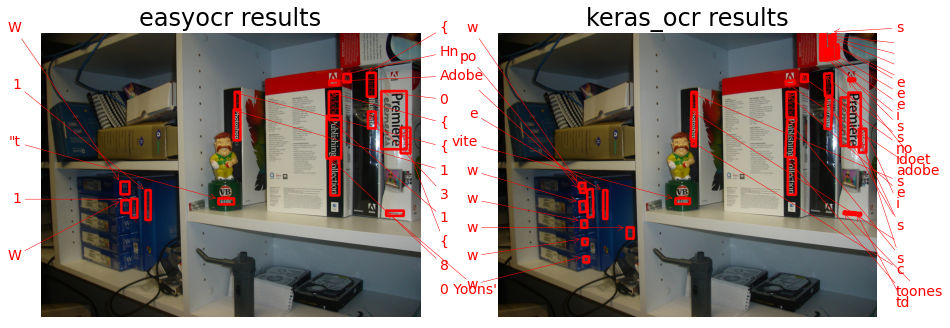

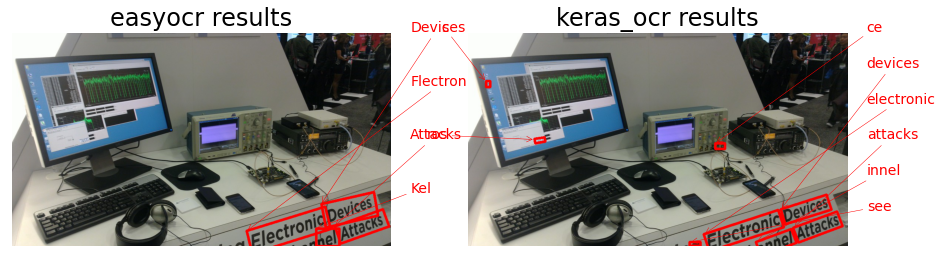

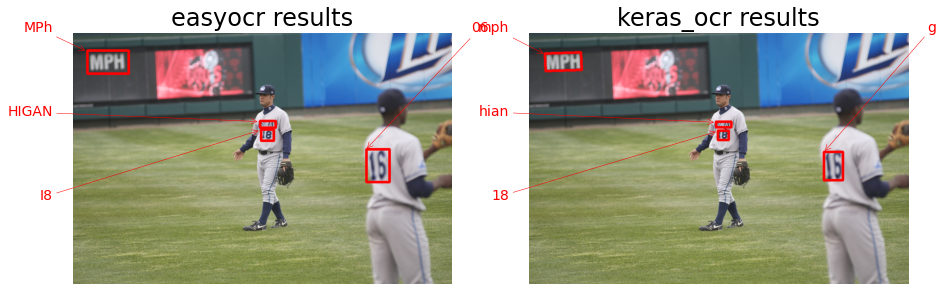

...

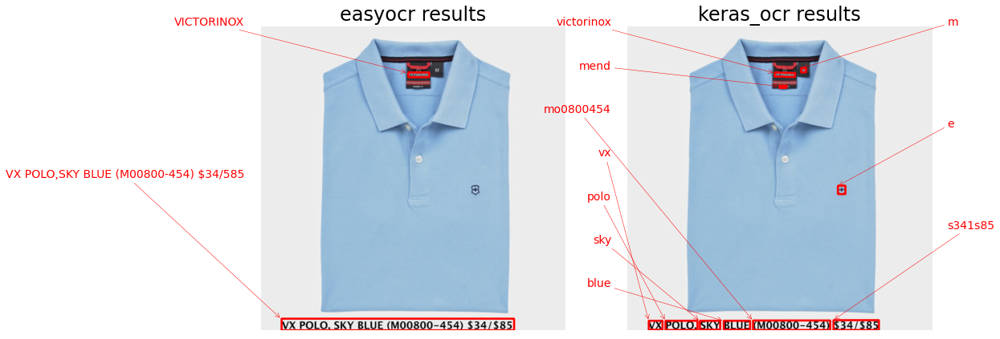

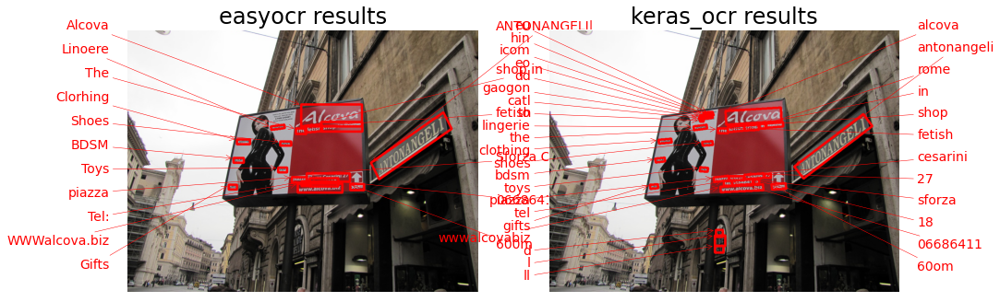

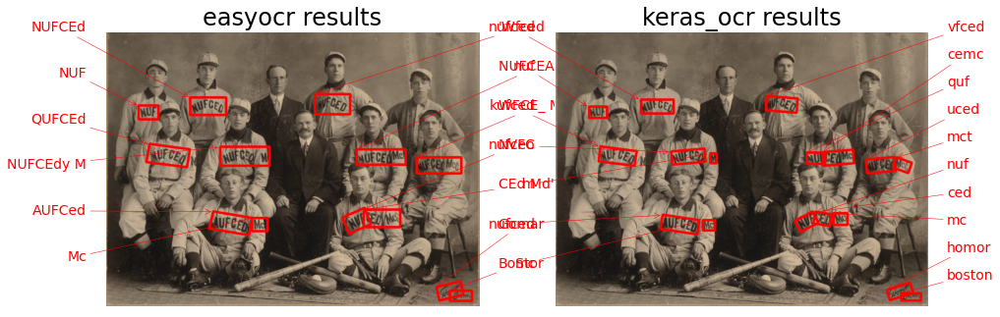

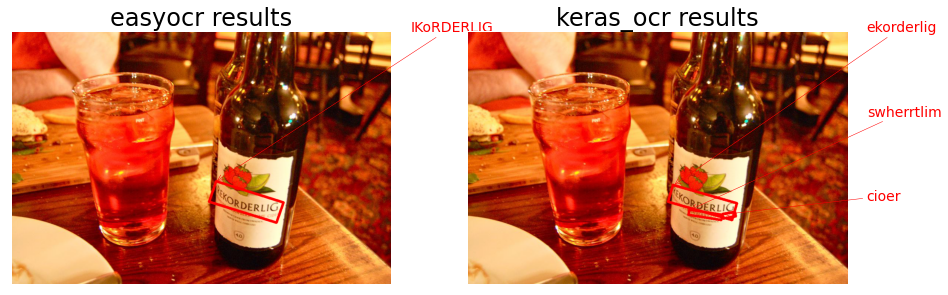

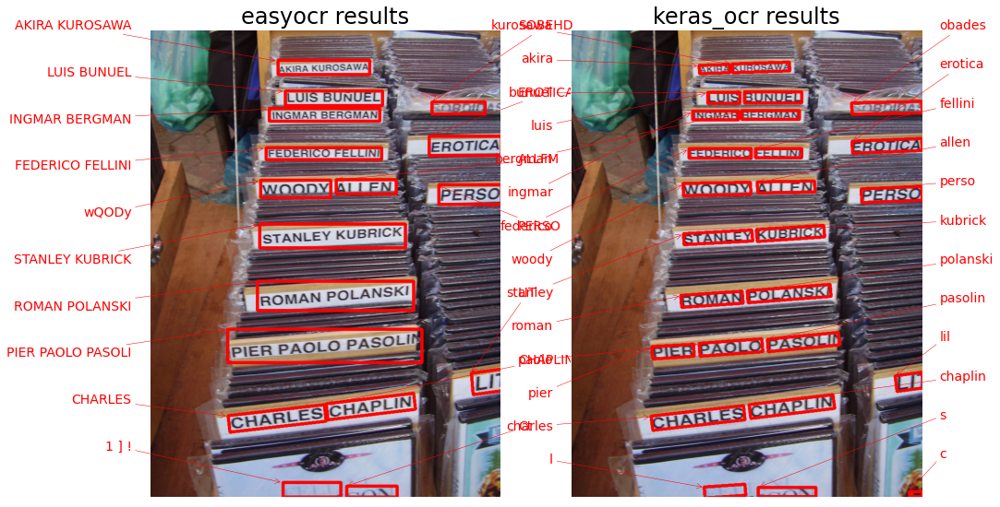

In [19]:
# Loop over results
for img_fn in img_fns[:25]:
    plot_compare(img_fn, easyocr_df, kerasocr_df)

# The End